# Importing libraries

In [2]:
import pandas as pd
import numpy as np

from glob import glob

import earthpy as et
import earthpy.spatial as es
import earthpy.plot as ep

import rasterio as rio
from rasterio.plot import plotting_extent
from rasterio.plot import show
from rasterio.plot import reshape_as_raster, reshape_as_image

import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

import plotly.graph_objects as go

np.seterr(divide='ignore', invalid='ignore')


import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import ListedColormap
from PIL import Image, ImageFilter, ImageDraw

from patchify import patchify
from osgeo import gdal
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap

import os


import tifffile as tiff

from glob import glob
from scipy.io import loadmat
from scipy.io import savemat

import rasterio as rio
from rasterio.plot import plotting_extent
from rasterio.plot import show
from rasterio.plot import reshape_as_raster, reshape_as_image


import earthpy as et
import earthpy.spatial as es
import earthpy.plot as ep

import plotly.graph_objects as go

import dask.array as da
import dask


np.seterr(divide='ignore', invalid='ignore')



{'divide': 'ignore', 'over': 'warn', 'under': 'ignore', 'invalid': 'ignore'}

### Displaying Folder contents


In [3]:
for dirname, _, filenames in os.walk("sundarbans_data/"):
    for filename in filenames:
        print(os.path.join(dirname, filename))



sundarbans_data/2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B01_(Raw).tiff
sundarbans_data/2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B02_(Raw).tiff
sundarbans_data/2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B03_(Raw).tiff
sundarbans_data/2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B04_(Raw).tiff
sundarbans_data/2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B05_(Raw).tiff
sundarbans_data/2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B06_(Raw).tiff
sundarbans_data/2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B07_(Raw).tiff
sundarbans_data/2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B08_(Raw).tiff
sundarbans_data/2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B09_(Raw).tiff
sundarbans_data/2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B11_(Raw).tiff
sundarbans_data/2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B12_(Raw).tiff
sundarbans_data/2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B8A_(Raw).tiff
sundarbans_data/2020-01-27-00_00_2020-01

### Return a list of paths matching a pathname pattern.

In [4]:
S_sentinel_bands = glob("sundarbans_data/*B?*.tiff")
S_sentinel_bands.sort()
S_sentinel_bands
     

['sundarbans_data\\2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B01_(Raw).tiff',
 'sundarbans_data\\2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B02_(Raw).tiff',
 'sundarbans_data\\2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B03_(Raw).tiff',
 'sundarbans_data\\2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B04_(Raw).tiff',
 'sundarbans_data\\2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B05_(Raw).tiff',
 'sundarbans_data\\2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B06_(Raw).tiff',
 'sundarbans_data\\2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B07_(Raw).tiff',
 'sundarbans_data\\2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B08_(Raw).tiff',
 'sundarbans_data\\2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B09_(Raw).tiff',
 'sundarbans_data\\2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B11_(Raw).tiff',
 'sundarbans_data\\2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B12_(Raw).tiff',
 'sundarbans_data\\2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L

### Storing data in a list 

In [5]:
l = []
for i in S_sentinel_bands:
  with rio.open(i, 'r') as f:
    l.append(f.read(1))

     

### Converting list to array

In [6]:
arr_st = np.stack(l)

In [7]:
arr_st.shape


(12, 954, 298)

### Using dask module (to convert numpy array into dask array for parallel and faster processing )


In [8]:
arr_d1 = da.from_array(arr_st, chunks='auto', asarray=None, fancy= False )

In [9]:
arr_d1

dask.array<array, shape=(12, 954, 298), dtype=uint16, chunksize=(12, 954, 298), chunktype=numpy.ndarray>

### Printing out Bands

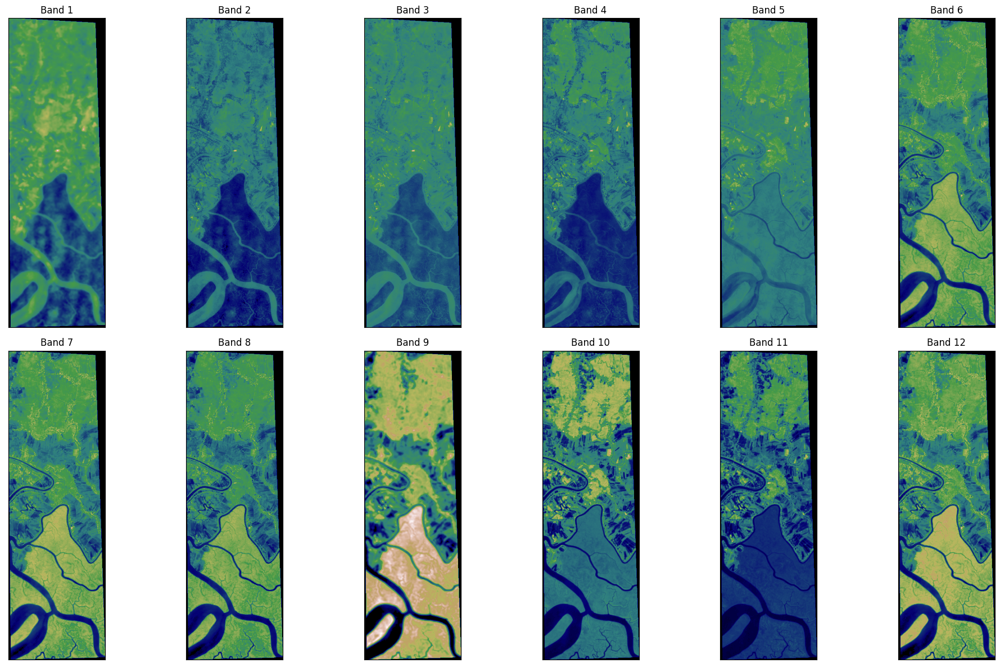

In [10]:
ep.plot_bands(arr_st, cmap = 'gist_earth', figsize = (20, 12), cols = 6, cbar = False)
plt.show()


## RGB Composite Image

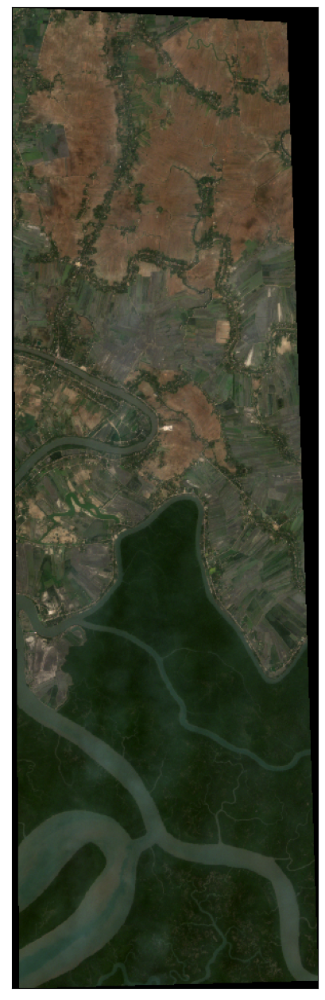

In [11]:

rgb = ep.plot_rgb(arr_st, 
                  rgb=(3,2,1), 
                  figsize=(10, 16), 
                  )

plt.show()
     

### RGB Composite Image with stretch applied

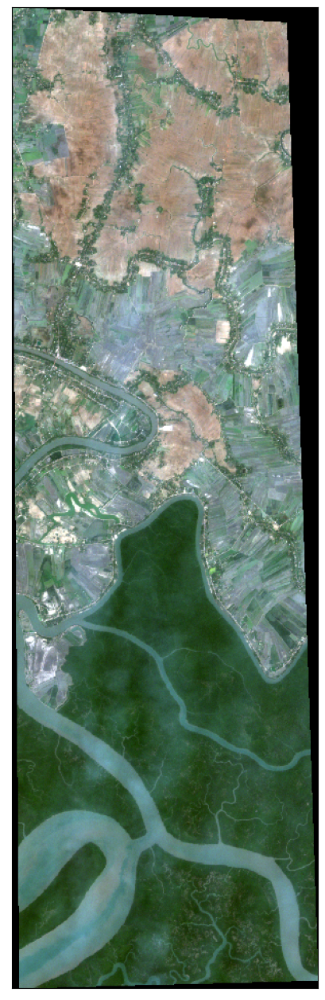

In [12]:
ep.plot_rgb(
    arr_st,
    rgb=(3, 2, 1),
    stretch=True,
    str_clip=0.2,
    figsize=(10, 16),
)

plt.show()
     

### Data Distribution of Bands

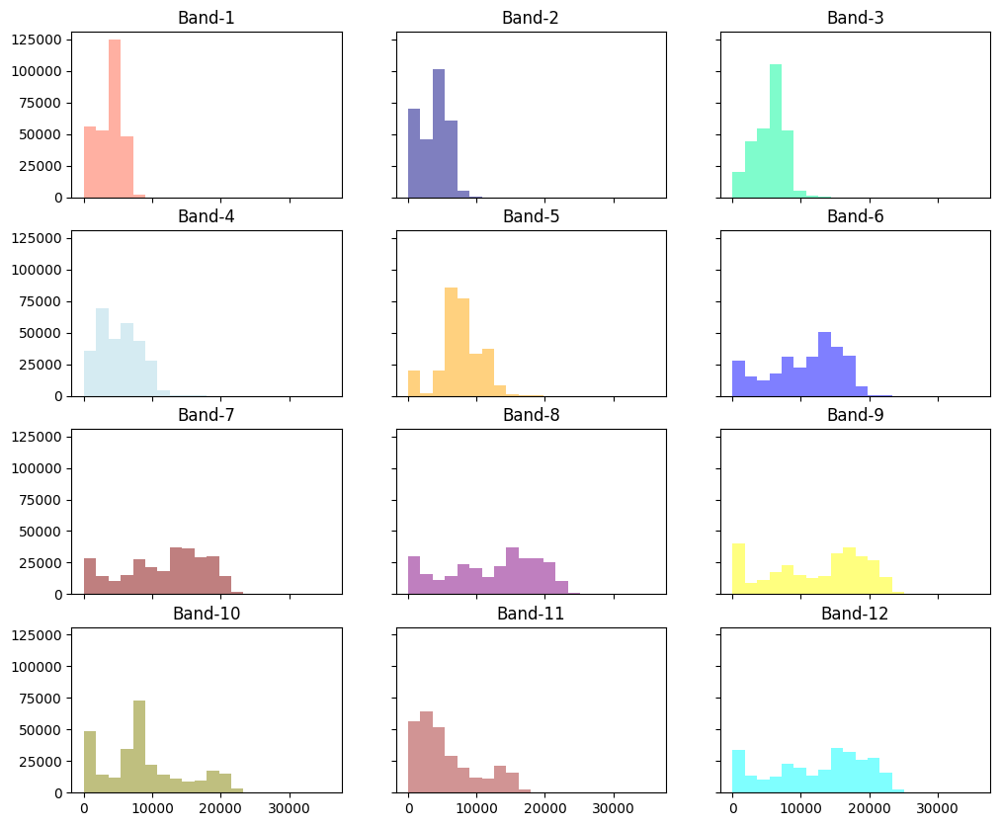

In [13]:
colors = ['tomato', 'navy', 'MediumSpringGreen', 'lightblue', 'orange', 'blue',
          'maroon', 'purple', 'yellow', 'olive', 'brown', 'cyan']

ep.hist(arr_st, 
         colors = colors,
        title=[f'Band-{i}' for i in range(1, 13)], 
        cols=3, 
        alpha=0.5, 
        figsize = (12, 10)
        )

plt.show()

# Vegetation and soils indices

### Normalized Difference Vegetation Index (NDVI)

#### NDVI = ((NIR - Red)/(NIR + Red))

- NIR = pixel values from the near-infrared band
- Red = pixel values from the red band

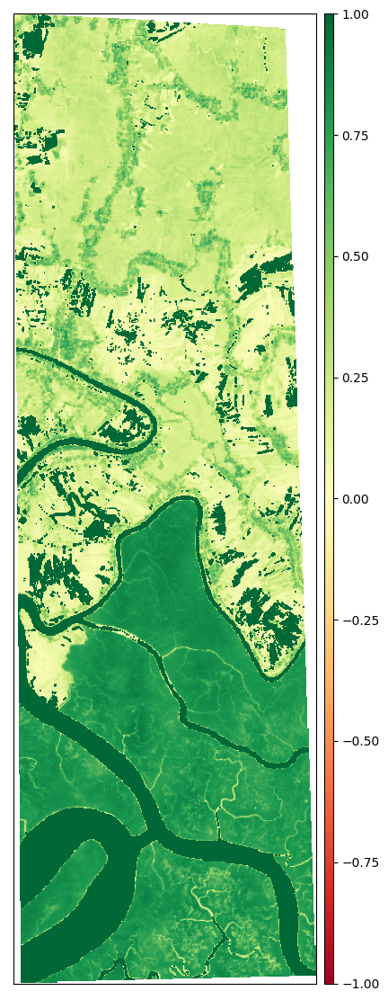

In [14]:
#vegetation index
ndvi = es.normalized_diff(arr_st[7], arr_st[3])

ep.plot_bands(ndvi, cmap="RdYlGn", cols=1, vmin=-1, vmax=1, figsize=(10, 14))

plt.show()


# Soil-Adjusted Vegetation Index (SAVI)

### SAVI = ((NIR - Red) / (NIR + Red + L)) x (1 + L)

##### L = amount of green vegetation cover

- NIR = pixel values from the near infrared band
- Red = pixel values from the near red band


In [15]:
L = 0.5
savi = ((arr_st[7] - arr_st[3]) / (arr_st[7] + arr_st[3] + L)) * (1 + L)

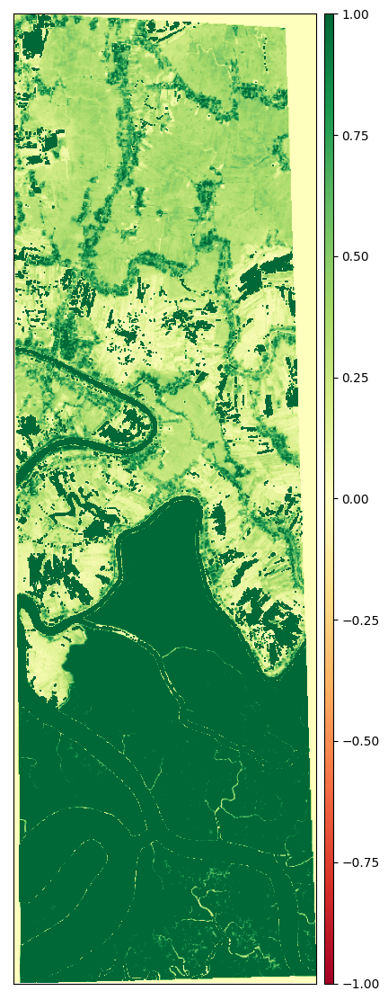

In [16]:
ep.plot_bands(savi, cmap="RdYlGn", cols=1, vmin=-1, vmax=1, figsize=(10, 14))

plt.show()

# Visible Atmospherically Resistant Index (VARI)

### VARI = (Green - Red)/ (Green + Red - Blue)

- Green = pixel values from the green band
- Red= pixel values from the red band
- Blue = pixel values from the blue band

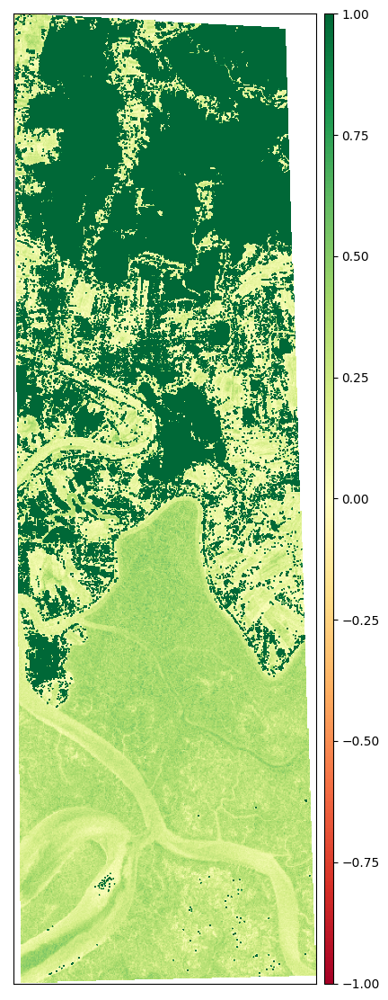

In [17]:
vari = (arr_st[2] - arr_st[3])/ (arr_st[2] + arr_st[3] - arr_st[1])

ep.plot_bands(vari, cmap="RdYlGn", cols=1, vmin=-1, vmax=1, figsize=(10, 14))
plt.show()

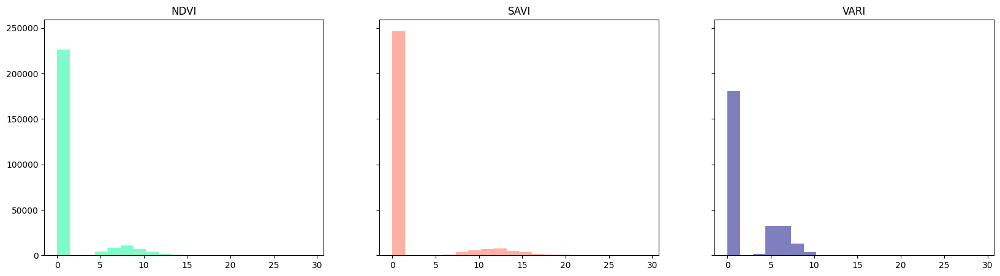

In [18]:

ep.hist(np.stack([ndvi, savi, vari]), 
        alpha=0.5,
        cols=3, 
        figsize=(20, 5),
        title = ['NDVI', 'SAVI', 'VARI'],
        colors = ['mediumspringgreen', 'tomato', 'navy'])
plt.show()

# Water Indices

### Modified Normalized Difference Water Index (MNDWI)

- MNDWI = (Green - SWIR) / (Green + SWIR)

- Green = pixel values from the green band

- SWIR = pixel values from the short-wave infrared band

In [19]:
mndwi = es.normalized_diff(arr_st[2], arr_st[10])


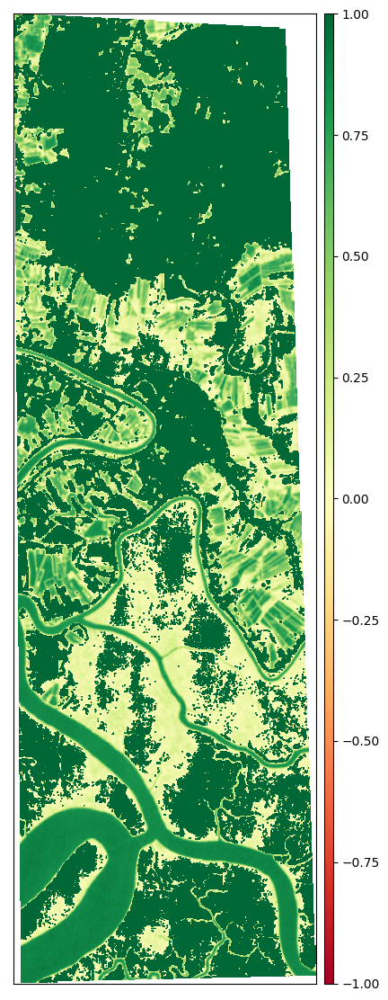

In [20]:
ep.plot_bands(mndwi, cmap="RdYlGn", cols=1, vmin=-1, vmax=1, figsize=(10, 14))

plt.show()
     

# Normalized Difference Moisture Index (NDMI)

#### NDMI = (NIR - SWIR1)/(NIR + SWIR1)

- NIR = pixel values from the near infrared band
- SWIR1 = pixel values from the short-wave infrared 1 band

In [21]:

ndmi = es.normalized_diff(arr_st[7], arr_st[10])

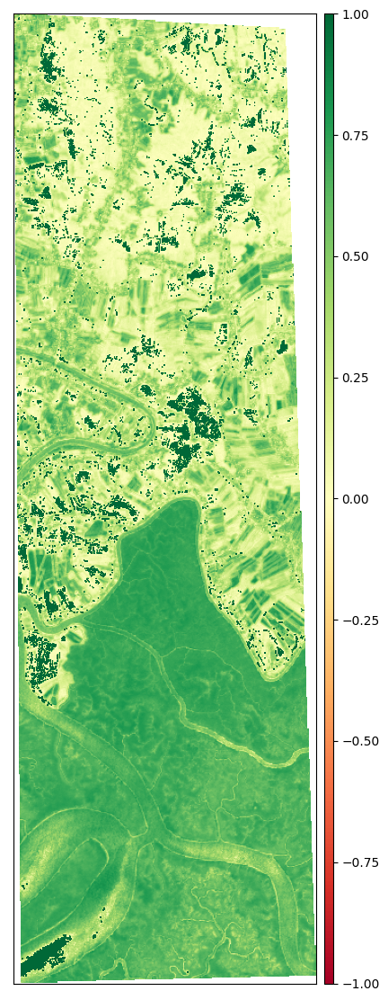

In [22]:
ep.plot_bands(ndmi, cmap="RdYlGn", cols=1, vmin=-1, vmax=1, figsize=(10, 14))

plt.show()


# Geology Indices

## Clay Minerals

### Clay Minerals Ratio = SWIR1 / SWIR2

- SWIR1 = pixel values from the short-wave infrared 1 band
- SWIR2 = pixel values from the short-wave infrared 2 band

In [23]:
cmr = np.divide(arr_st[10], arr_st[11])


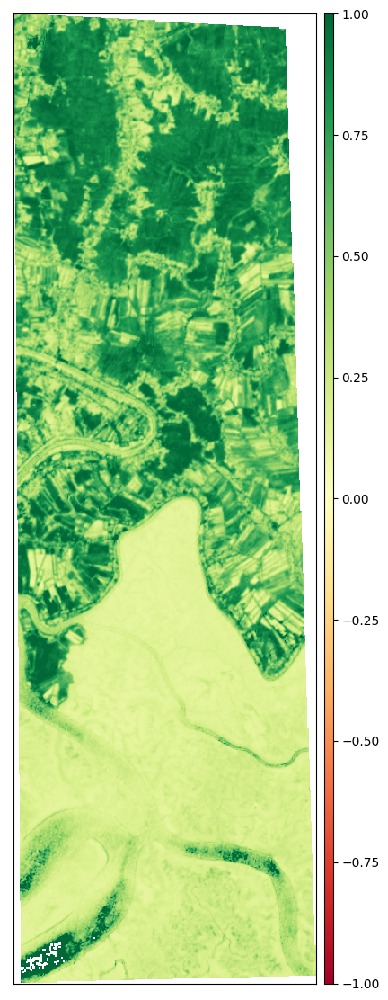

In [24]:
ep.plot_bands(cmr, cmap="RdYlGn", cols=1, vmin=-1, vmax=1, figsize=(10, 14))

plt.show()

# 
# Ferrous Minerals
  ## Ferrous Minerals Ratio = SWIR / NIR
  
  - SWIR= pixel values from the short-wave infrared band
  - NIR = pixel values from the near infrared band

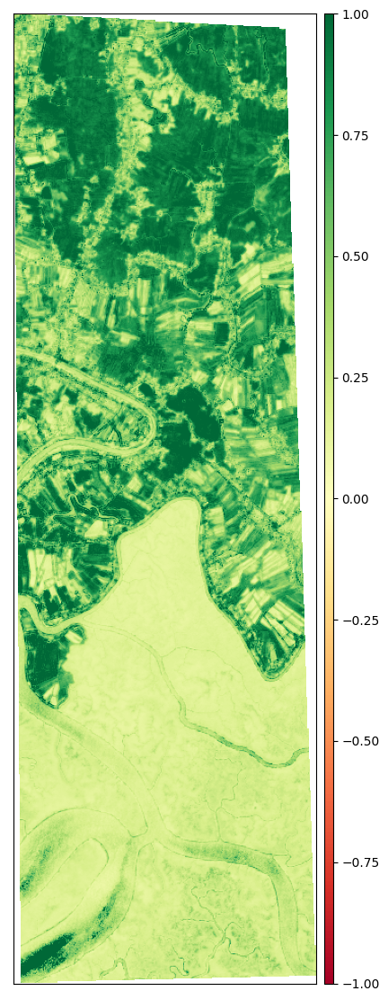

In [25]:
fmr = np.divide(arr_st[10], arr_st[7])

ep.plot_bands(fmr, cmap="RdYlGn", cols=1, vmin=-1, vmax=1, figsize=(10, 14))

plt.show()

# PART-2 (UNSUPERVISED_LEARNING)

## LAND COVER CLASSIFICATION 

### Preprocessing

In [26]:
x = np.moveaxis(arr_st, 0, -1)
x.shape

(954, 298, 12)

In [27]:
x.reshape(-1, 12).shape, 954*298


((284292, 12), 284292)

In [28]:

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

X_data = x.reshape(-1, 12)

scaler = StandardScaler().fit(X_data)

X_scaled = scaler.transform(X_data)

X_scaled.shape

(284292, 12)

In [31]:
y_data = loadmat('sundarbans_data/Sundarbands_gt.mat')['gt']
y_data.shape

(954, 298)

In [32]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_data.ravel(), test_size=0.30, stratify = y_data.ravel())

print(f'X_train Shape: {X_train.shape}\nX_test Shape: {X_test.shape}\ny_train Shape: {y_train.shape}\ny_test Shape:{y_test.shape}')

X_train Shape: (199004, 12)
X_test Shape: (85288, 12)
y_train Shape: (199004,)
y_test Shape:(85288,)


# Light BGM

In [33]:

import lightgbm as lgb

d_train = lgb.Dataset(X_train, label=y_train)

params={}
params['learning_rate']=0.03
params['boosting_type']='gbdt' #GradientBoostingDecisionTree
params['objective']='multiclass' #Multi-class target feature
params['metric']='multi_logloss' #metric for multi-class
params['max_depth']=15
params['num_class']=6 #no.of unique values in the target class not inclusive of the end value

clf = lgb.train(params, d_train, 100)

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018085 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3060
[LightGBM] [Info] Number of data points in the train set: 199004, number of used features: 12
[LightGBM] [Info] Start training from score -1.659694
[LightGBM] [Info] Start training from score -1.286046
[LightGBM] [Info] Start training from score -2.638465
[LightGBM] [Info] Start training from score -1.625235
[LightGBM] [Info] Start training from score -1.840073
[LightGBM] [Info] Start training from score -2.241496
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


In [34]:
lgb_predictions = clf.predict(X_test)


In [35]:
print(lgb_predictions[1], np.argmax(lgb_predictions[1]))


[2.04183693e-03 2.63671712e-03 7.91142882e-04 9.90796305e-01
 1.68188833e-03 2.05210955e-03] 3


In [39]:
from sklearn.metrics import accuracy_score

lgb_pred = np.argmax(lgb_predictions, axis=1)

print(f"Accuracy: {accuracy_score(y_test, lgb_pred)*100}")
lgb_pred.shape

Accuracy: 98.9799268361317


(85288,)

In [40]:
from sklearn.metrics import classification_report


print(classification_report(y_test, lgb_pred))


              precision    recall  f1-score   support

           0       0.98      0.98      0.98     16222
           1       1.00      1.00      1.00     23570
           2       1.00      1.00      1.00      6095
           3       0.99      0.99      0.99     16790
           4       0.99      0.99      0.99     13545
           5       0.97      0.97      0.97      9066

    accuracy                           0.99     85288
   macro avg       0.99      0.99      0.99     85288
weighted avg       0.99      0.99      0.99     85288



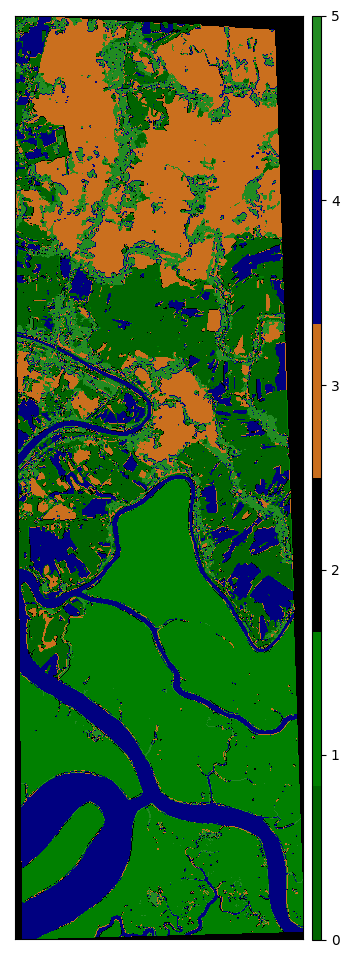

In [41]:


# Visualize Classification Map of LightGBM

ep.plot_bands(np.argmax(clf.predict(X_scaled), axis=1).reshape((954, 298)), 
              cmap=ListedColormap(['darkgreen', 'green', 'black', 
                                   '#CA6F1E', 'navy', 'forestgreen']))
plt.show()

# PCA (Principal component analysis)

In [42]:


pca = PCA(n_components = 4)

pca.fit(X_scaled)

data = pca.transform(X_scaled)

In [43]:
data.shape


(284292, 4)

In [44]:
pca.explained_variance_ratio_


array([0.55778198, 0.37521242, 0.0484222 , 0.00637526])

In [45]:
np.sum(pca.explained_variance_ratio_)


0.9877918653349456

## PCA Visulaisation

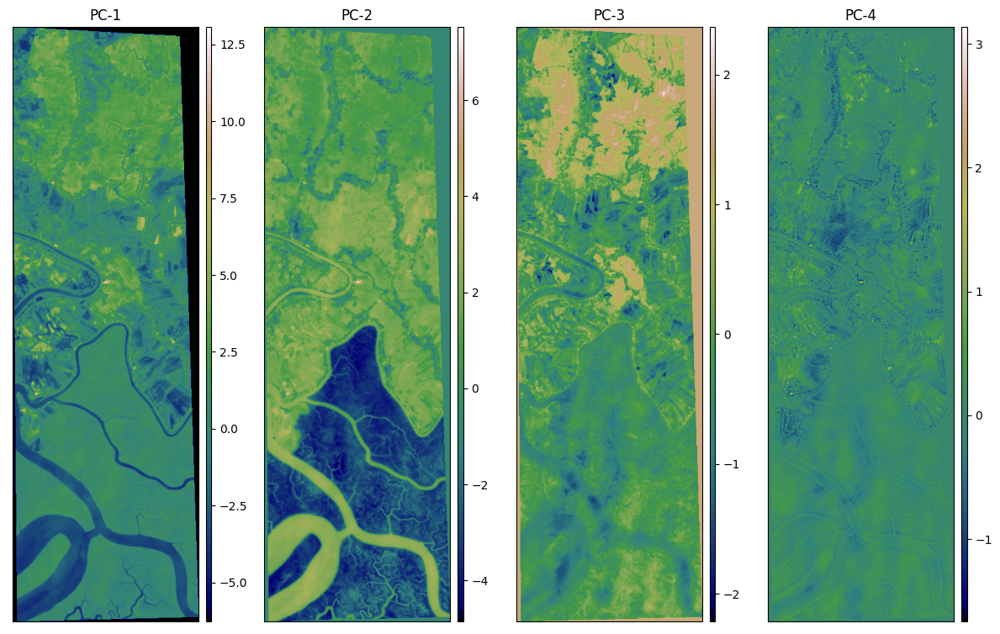

In [46]:
ep.plot_bands(np.moveaxis(data.reshape((954, 298, data.shape[1])), -1, 0),
              cmap = 'gist_earth',
              cols = 4,
              title = [f'PC-{i}' for i in range(1,5)])

plt.show()
     

In [47]:

from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters = 6, random_state = 11)

kmeans.fit(data)

KMeans(n_clusters=6, random_state=11)

In [48]:
labels = kmeans.predict(data)


In [49]:
np.unique(labels)


array([0, 1, 2, 3, 4, 5])

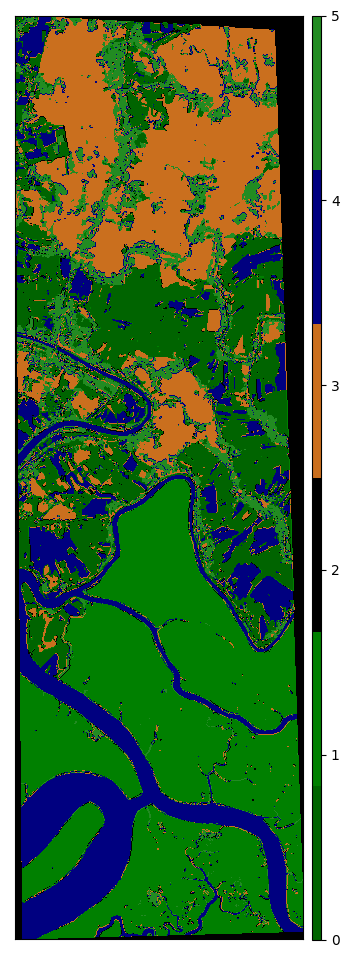

In [50]:

ep.plot_bands(labels.reshape(954, 298), cmap=ListedColormap(['darkgreen', 'green', 'black', '#CA6F1E', 'navy', 'forestgreen']))
plt.show()


In [51]:
#Interactive plot using plotly
import plotly.express as px

fig = px.imshow(labels.reshape(954, 298), 
          color_continuous_scale = ['darkgreen', 'green', 'black', '#CA6F1E', 'navy', 'forestgreen'])

fig.update_xaxes(showticklabels=False)

fig.update_yaxes(showticklabels=False)

fig.update_layout(
    autosize=False,
    width=500,
    height=1000,
    margin=dict(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=4
    ),
    # paper_bgcolor="LightSteelBlue",
)